In [1]:
!pip install tensorflow_addons

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 5.4 MB/s eta 0:00:00
  Attempting uninstall: typeguard
    Found existing installation: typeguard 4.1.5
    Uninstalling typeguard-4.1.5:
      Successfully uninstalled typeguard-4.1.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ydata-profiling 4.6.4 requires typeguard<5,>=4.1.2, but you have typeguard 2.13.3 which is incompatible.


In [2]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
from keras.utils import plot_model
import tensorflow_addons as tfa

2024-12-09 16:56:34.746585: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-09 16:56:34.746690: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-09 16:56:34.865636: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our Tens

In [3]:
!pip install -U segmentation-models

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 4.2 MB/s eta 0:00:00


In [4]:
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

In [5]:
import tensorflow as tf
import segmentation_models as sm
import glob

import os

import cv2

import numpy as np
from matplotlib import pyplot as plt
from tensorflow import keras

from tensorflow.keras.utils import normalize
from tensorflow.keras.metrics import MeanIoU
from segmentation_models import Unet, Linknet, PSPNet, FPN

Segmentation Models: using `tf.keras` framework.


In [6]:
train_data="/kaggle/input/buildingfootprintsegmentation/semanticSegmentation/Images"
# test_data="/kaggle/input/buildingfootprintextraction/test"
image_files = [f for f in os.listdir(train_data) if os.path.isfile(os.path.join(train_data, f))]

In [7]:
train_sat_data = [f for f in os.listdir(train_data) 
              if os.path.isfile(os.path.join(train_data, f)) and f.lower().endswith('.tif')]


In [8]:
# print(train_sat_data)

In [9]:
# train_mask_data = [f for f in os.listdir(train_data) 
#               if os.path.isfile(os.path.join(train_data, f)) and f.lower().endswith('.png')]

In [10]:
# Set the seed for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

# Define the input image size
IMG_HEIGHT = 256
IMG_WIDTH = 256
IMG_CHANNELS = 3

In [11]:
train_files = sorted(os.listdir(train_data))

In [12]:
number_of_images = len(train_files)
# number_of_images = 200

In [13]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

X = np.zeros((number_of_images, 256, 256, IMG_CHANNELS), dtype=np.uint8)
print(X.shape)
# print(X)
# Y = np.zeros((len(mask_files), 256, 256, 1), dtype=np.bool)
Y = np.zeros((number_of_images, 256, 256, 1), dtype=bool)
print(Y.shape)
for i, train_file in enumerate(train_sat_data[:number_of_images]):
    # print(train_file, mask_file)
    # print(os.path.join(train_data, train_file))
    img = load_img(os.path.join(train_data, train_file))
    resizeimg= img.resize((256,256))
    X[i] = img_to_array(resizeimg)

    mask = load_img(os.path.join(train_data,train_file).replace('Images', 'masks').replace('tif', 'png'))
    resize_mask = mask.resize((256,256))
    mask_array = img_to_array(resize_mask)
    Y[i] = np.expand_dims(np.dot(mask_array, [0.2989, 0.5870, 0.1140]) /255.0, axis=-1) > 0.5

(1377, 256, 256, 3)
(1377, 256, 256, 1)


In [14]:
BACKBONE = 'resnet152'

In [15]:
class IoUScore(tf.keras.metrics.Metric):
    def __init__(self, name="iou_score", **kwargs):
        super(IoUScore, self).__init__(name=name, **kwargs)
        self.intersection = self.add_weight(name="intersection", initializer="zeros", dtype=tf.float32)
        self.union = self.add_weight(name="union", initializer="zeros", dtype=tf.float32)

    def update_state(self, y_true, y_pred, sample_weight=None):
        # Ensure predictions are binary (thresholding at 0.5)
        y_pred = tf.cast(y_pred > 0.5, tf.float32)
        y_true = tf.cast(y_true, tf.float32)

        # Calculate intersection and union
        intersection = tf.reduce_sum(y_true * y_pred)
        union = tf.reduce_sum(y_true + y_pred - y_true * y_pred)

        # Update state variables
        self.intersection.assign_add(intersection)
        self.union.assign_add(union)

    def result(self):
        # Calculate IoU
        return tf.math.divide_no_nan(self.intersection, self.union)

    def reset_states(self):
        # Reset the state variables at the end of each epoch
        self.intersection.assign(0.0)
        self.union.assign(0.0)

In [16]:
activation='sigmoid'

LR = 0.000005
# optim = keras.optimizers.SGD(LR)
optim = tf.keras.optimizers.RMSprop(LR)
# optim = keras.optimizers.RMSprop(LR)
metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]
# metrics = [tf.keras.metrics.IoU(num_classes=1, target_class_ids=[0])]
# metrics = [IoUScore()]

In [17]:
# Split the data into training and validation sets
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.1, random_state=42)
X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.16667, random_state=42)

In [18]:
train_dataset = tf.data.Dataset.from_tensor_slices((X_train, Y_train))
val_dataset = tf.data.Dataset.from_tensor_slices((X_val, Y_val))
test_dataset = tf.data.Dataset.from_tensor_slices((X_test, Y_test))

In [19]:
# Data augmentation
preprocess_input1 = sm.get_preprocessing(BACKBONE)

def augment_image_and_mask(image, mask):
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        mask = tf.image.flip_left_right(mask)
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_up_down(image)
        mask = tf.image.flip_up_down(mask)
    rotation_angle = tf.random.uniform((), -0.5, 0.5)
    image = tfa.image.rotate(image, rotation_angle)
    mask = tfa.image.rotate(mask, rotation_angle)
    image = tf.image.random_brightness(image, max_delta=0.3)
    return image, mask

# Preprocessing and augmentation pipeline
def preprocess_and_augment(dataset, input_size, augment=True):
    def resize_and_process(image, mask):
        image = tf.image.resize(image, input_size)
        mask = tf.cast(mask, tf.float32)  # Ensure mask is in a valid data type
        mask = tf.image.resize(mask, input_size, method='nearest')
        if augment:
            image, mask = augment_image_and_mask(image, mask)
        # image = preprocess_input1(image).astype(np.float32)
        return image, mask
    return dataset.map(resize_and_process, num_parallel_calls=tf.data.AUTOTUNE)


In [20]:
input_size = (256,256)
train_dataset = preprocess_and_augment(train_dataset, input_size, augment=True)
val_dataset = preprocess_and_augment(val_dataset, input_size, augment=False)
test_dataset = preprocess_and_augment(test_dataset, input_size, augment=False)


In [21]:
# Batch and prefetch datasets
train_dataset = train_dataset.batch(16).prefetch(tf.data.AUTOTUNE)
val_dataset = val_dataset.batch(16).prefetch(tf.data.AUTOTUNE)
test_dataset = test_dataset.batch(1).prefetch(tf.data.AUTOTUNE)

In [22]:
from tensorflow.python.keras.callbacks import EarlyStopping
loss_all = []
preprocess_input1 = sm.get_preprocessing(BACKBONE)
# preprocess input
X_train1 = preprocess_input1(X_train)
X_test1 = preprocess_input1(X_test)
X_val1 = preprocess_input1(X_val)
# print(model.__name__)
# plt.title(f'Training and validation loss of {model.__name__} with {backbone_name}')

# define model
model1 = Unet(backbone_name=BACKBONE, encoder_weights='imagenet', classes=1, activation=activation)
# compile keras model with defined optimozer, loss and metrics
model1.compile(optim, loss='binary_crossentropy', metrics=metrics)
# model1.summary()

234326024/234326024 [==============================] - 5s 0us/step


In [23]:
my_callbacks = [
    keras.callbacks.EarlyStopping(patience = 30, monitor='val_loss'),
    keras.callbacks.ModelCheckpoint(filepath='best_model.h5', save_best_only=True),
    keras.callbacks.TensorBoard(log_dir='./logs'),
]
history1=model1.fit(
    train_dataset,
    batch_size=16,
    epochs=500,
    verbose=1,
    validation_data=val_dataset,
    callbacks = my_callbacks  
)

model1.evaluate(X_test1,Y_test)

Epoch 1/500


I0000 00:00:1733763492.026391      78 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


65/65 [==============================] - ETA: 0s - loss: 0.7375 - iou_score: 0.3809 - f1-score: 0.5507

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


65/65 [==============================] - 94s 566ms/step - loss: 0.7375 - iou_score: 0.3809 - f1-score: 0.5507 - val_loss: 0.6724 - val_iou_score: 0.3832 - val_f1-score: 0.5532
Epoch 2/500
65/65 [==============================] - 26s 399ms/step - loss: 0.6475 - iou_score: 0.4496 - f1-score: 0.6194 - val_loss: 0.6450 - val_iou_score: 0.4850 - val_f1-score: 0.6522
Epoch 3/500
65/65 [==============================] - 26s 398ms/step - loss: 0.5892 - iou_score: 0.5113 - f1-score: 0.6758 - val_loss: 0.6146 - val_iou_score: 0.5325 - val_f1-score: 0.6943
Epoch 4/500
65/65 [==============================] - 26s 398ms/step - loss: 0.5454 - iou_score: 0.5614 - f1-score: 0.7184 - val_loss: 0.5836 - val_iou_score: 0.5662 - val_f1-score: 0.7226
Epoch 5/500
65/65 [==============================] - 26s 399ms/step - loss: 0.5071 - iou_score: 0.6068 - f1-score: 0.7546 - val_loss: 0.5576 - val_iou_score: 0.5925 - val_f1-score: 0.7438
Epoch 6/500
65/65 [==============================] - 26s 399ms/step - lo

[0.3751696050167084, 0.7476308345794678, 0.8553978800773621]

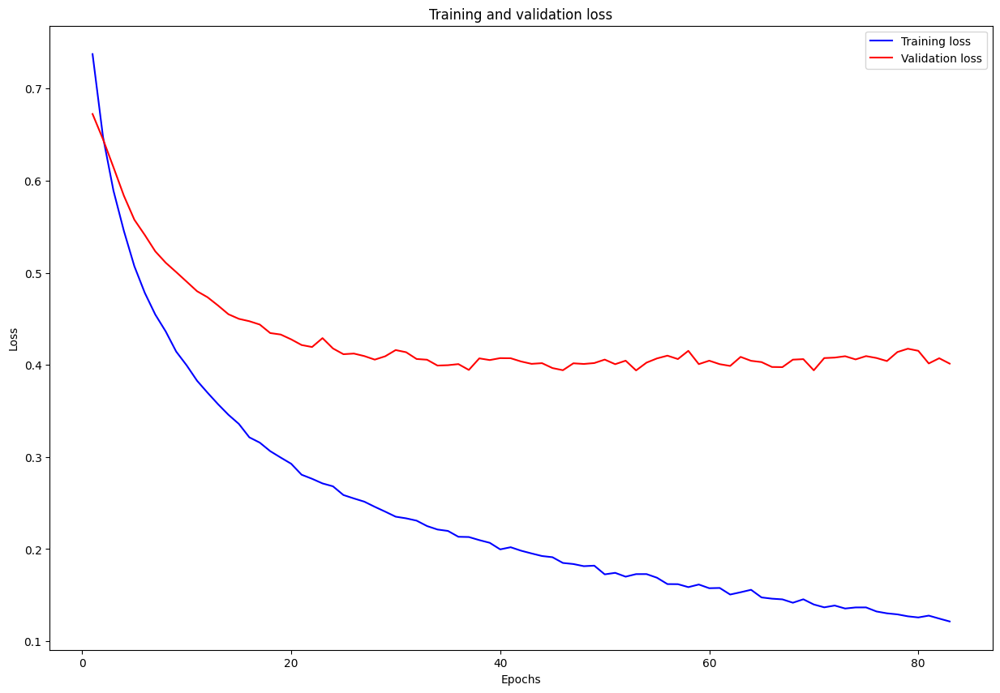

In [24]:
#plot the training and validation accuracy and loss at each epoch
loss = history1.history['loss']
loss_all.append(loss)
val_loss = history1.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure(figsize=(15,10))
# plt.subplot(1,2,1)
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

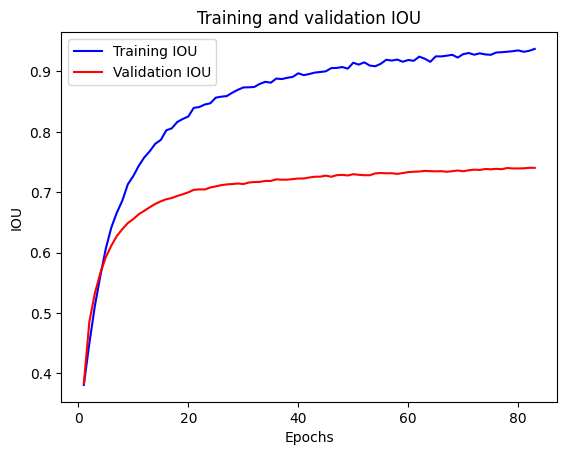

In [25]:
acc = history1.history['iou_score']
val_acc = history1.history['val_iou_score']
# plt.figure(figsize=(10,5))
# plt.subplot(1,2,2)
plt.plot(epochs, acc, 'b', label='Training IOU')
plt.plot(epochs, val_acc, 'r', label='Validation IOU')
plt.title('Training and validation IOU')
plt.xlabel('Epochs')
plt.ylabel('IOU')
plt.legend()
plt.show()

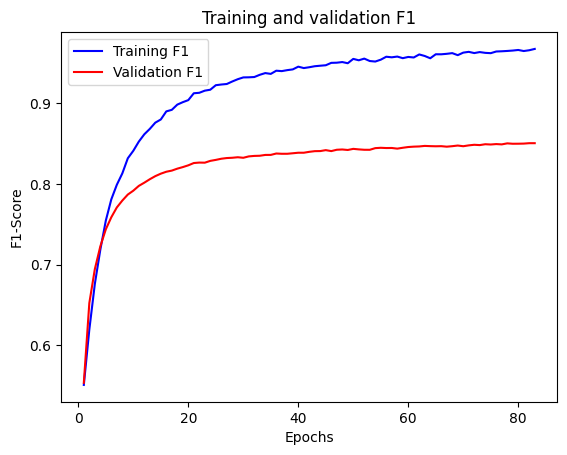

In [26]:
acc = history1.history['f1-score']
val_acc = history1.history['val_f1-score']
# plt.figure(figsize=(10,5))
# plt.subplot(1,2,2)
plt.plot(epochs, acc, 'b', label='Training F1')
plt.plot(epochs, val_acc, 'r', label='Validation F1')
plt.title('Training and validation F1')
plt.xlabel('Epochs')
plt.ylabel('F1-Score')
plt.legend()
plt.show()

In [27]:
y_pred = model1.predict(X_test)
y_pred_threshold = y_pred>0.5


5/5 [==============================] - 3s 198ms/step


In [28]:
def display_examples(i):
    plt.figure(figsize=(15,10))

    plt.subplot(1,3,1)
    plt.imshow(X_test[i,:,:,:])
    plt.title("Image")
    
    plt.subplot(1,3,2)
    plt.imshow(Y_test[i,:,:,0])
    plt.title("Ground Truth")
    
    plt.subplot(1,3,3)
    plt.imshow(y_pred_threshold[i, :, :, 0])
    plt.title('Prediction')
    
    plt.savefig(f'example{i}.jpg')
    plt.show()

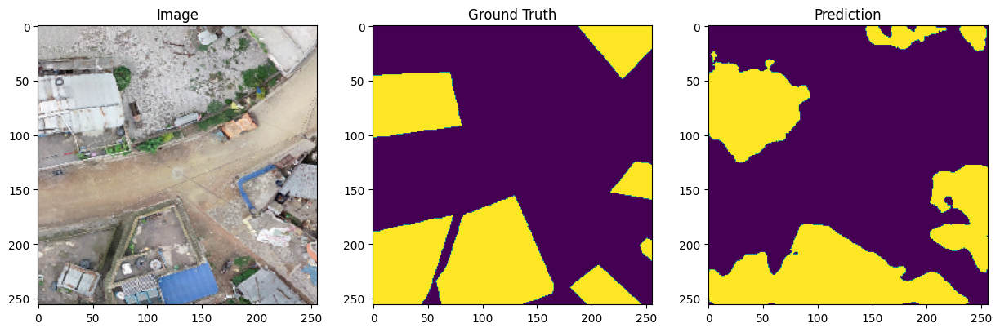

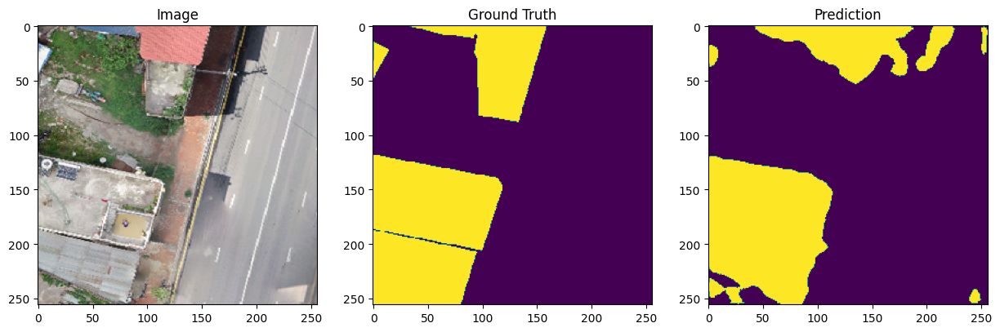

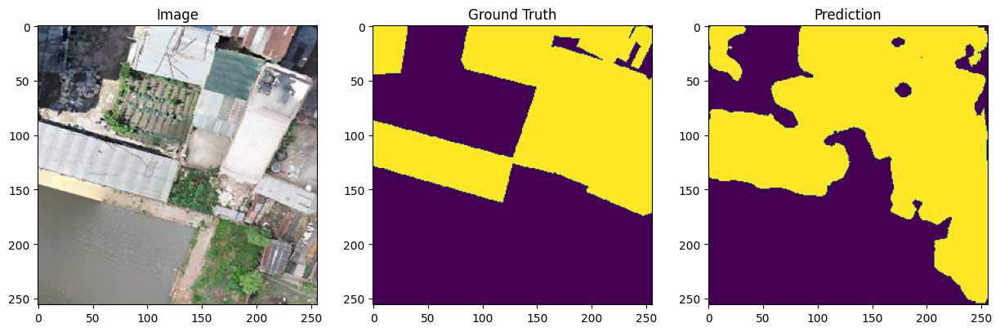

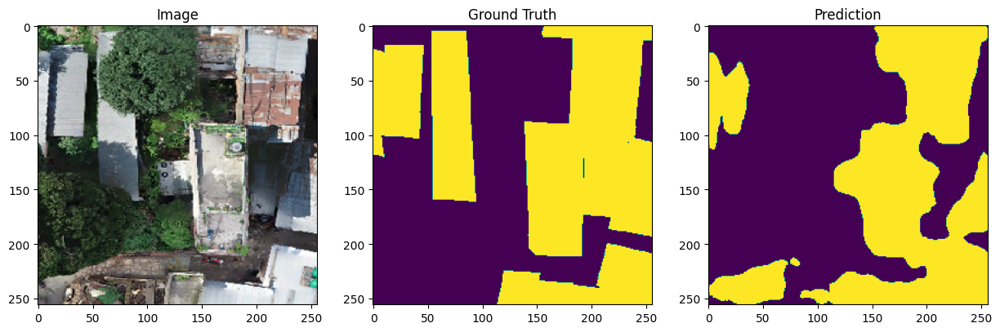

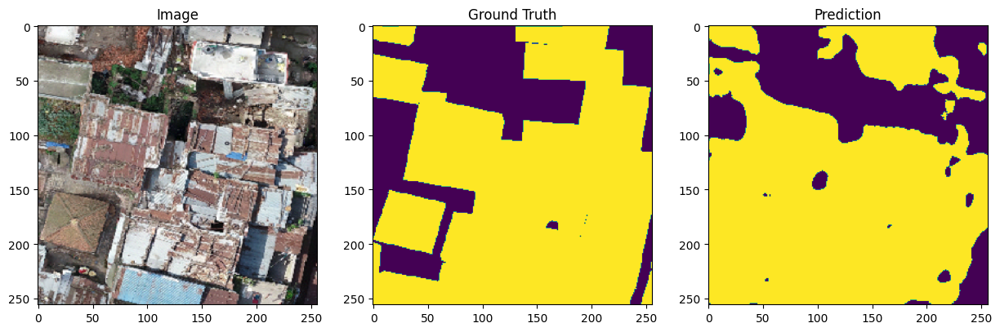

...

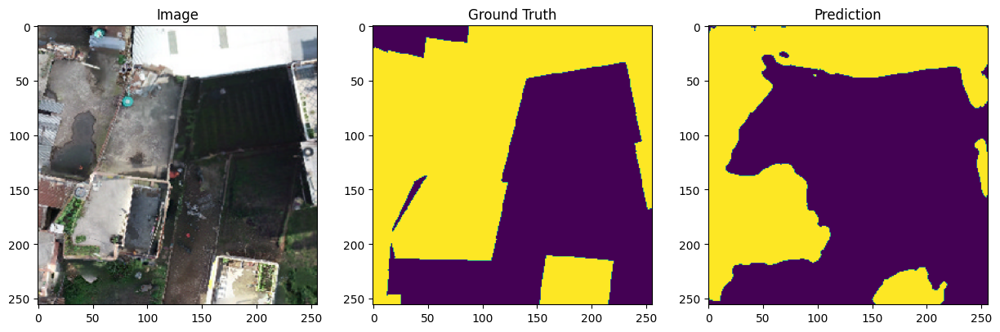

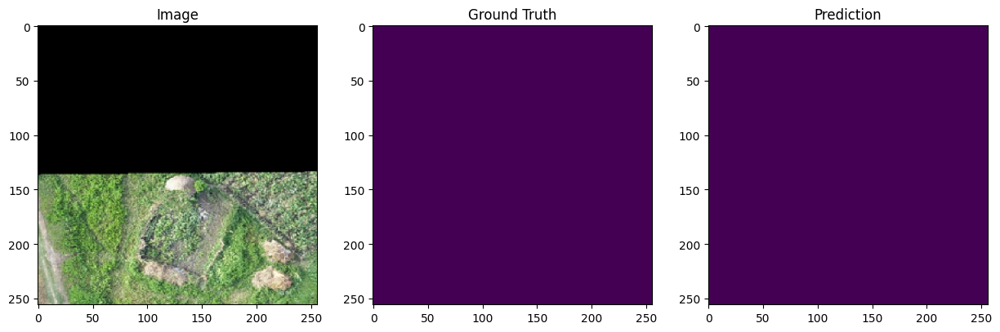

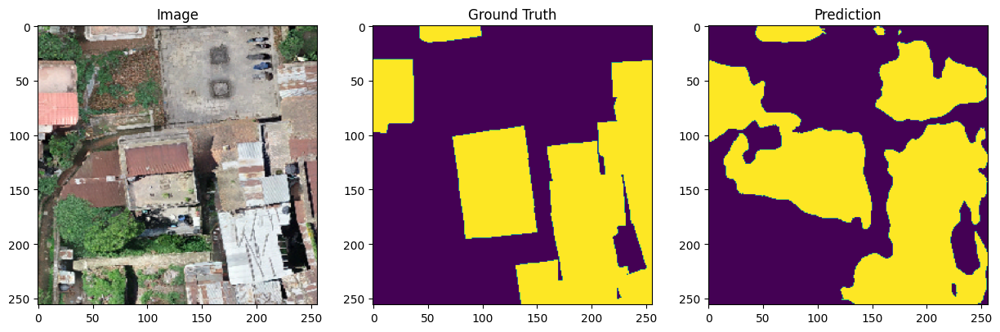

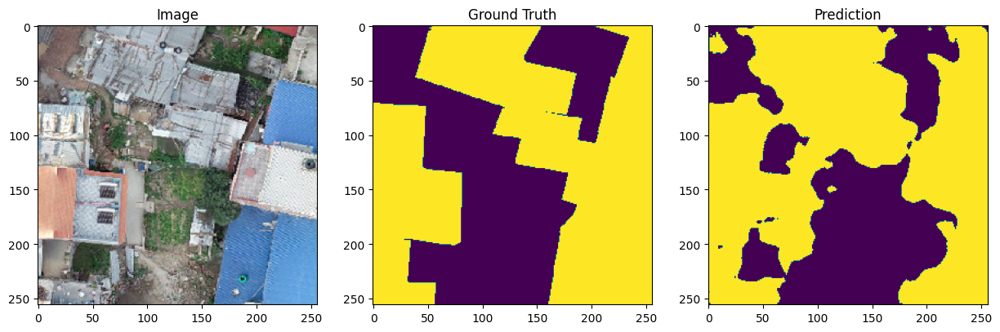

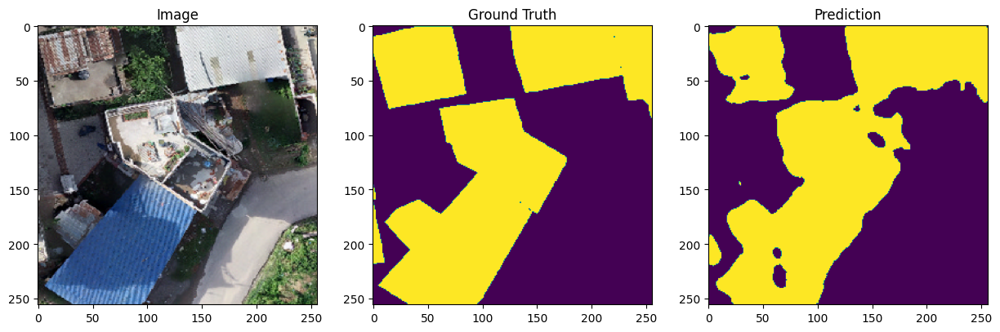

In [29]:
for i in range(40):
    display_examples(i)

In [30]:
import torch
def iou(mask1, mask2):
    intersection = (mask1 * mask2).sum()
    if intersection == 0:
        return 0.0
    union = torch.logical_or(mask1, mask2).to(torch.int).sum()
    return intersection / union

In [31]:
sum = 0
for target, pred in zip(Y_test, y_pred_threshold):
    sum += iou(torch.from_numpy(target), torch.from_numpy(pred))
print(f'iou = {sum/len(Y_test)}')

iou = 0.6852918267250061


In [32]:
model1.save('last_model.h5')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [33]:
import pickle

In [34]:
with open('history.pkl', 'wb') as file:
    pickle.dump( history1.history, file)